In [1]:
# Import required packages
import pandas as pd
import numpy as np
import warnings
import re

# Visualization
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.pylab as pylab
%matplotlib inline
import seaborn as sns
sns.set_style("darkgrid")
mpl.style.use('ggplot')


import gc
import geopandas as gpd
from shapely.geometry import Point, Polygon

pd.set_option('display.max_colwidth', None)

In [2]:
file_path = file_path = '../project_data/'

#Energy related
df_solar = pd.read_csv(file_path + 'solar_cleaned.csv')
df_water = pd.read_csv(file_path + 'water_cleaned.csv')
df_electricity = pd.read_csv(file_path + 'electricity_cleaned.csv')
df_gas = pd.read_csv(file_path + 'gas_cleaned.csv')
df_hotwater = pd.read_csv(file_path + 'hotwater_cleaned.csv')
df_irrigation = pd.read_csv(file_path + 'irrigation_cleaned.csv')
df_chilledwater = pd.read_csv(file_path + 'chilledwater_cleaned.csv')
df_steam = pd.read_csv(file_path + 'steam_cleaned.csv')

#Metadata
df_metadata = pd.read_csv(file_path + 'metadata.csv')

#Weather
df_weather = pd.read_csv(file_path + 'weather.csv')

In [3]:
# Find the range of year built
yearbuilt_min = df_metadata['yearbuilt'].min()
yearbuilt_max = df_metadata['yearbuilt'].max()

print(f"Year Built Range: {yearbuilt_min} - {yearbuilt_max}")


Year Built Range: 1900.0 - 2017.0


    Year Built  Total Count  Percentage
75        1976           84   10.281518
65        1966           37    4.528764
19        1919           29    3.549572
67        1968           20    2.447980
63        1964           17    2.080783


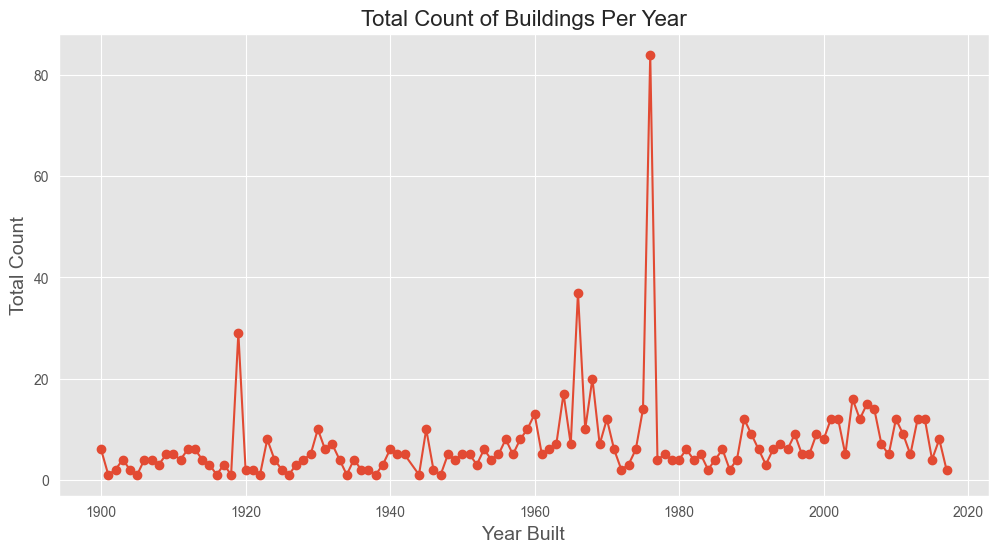

In [6]:
# Count the total number of buildings per year
buildings_per_year = df_metadata['yearbuilt'].dropna().astype(int).value_counts().sort_index()

# Convert to a DataFrame for easier visualization
buildings_per_year_df = buildings_per_year.reset_index()
buildings_per_year_df.columns = ['Year Built', 'Total Count']

# Calculate percentage of total
total_buildings = buildings_per_year_df['Total Count'].sum()
buildings_per_year_df['Percentage'] = (buildings_per_year_df['Total Count'] / total_buildings) * 100

# Sort by percentage in descending order and view the top 5
top_5_years = buildings_per_year_df.sort_values(by='Percentage', ascending=False).head(5)

# Display the result
print(top_5_years)


plt.figure(figsize=(12, 6))
plt.plot(buildings_per_year.index, buildings_per_year.values, marker='o', linestyle='-')
plt.title('Total Count of Buildings Per Year', fontsize=16)
plt.xlabel('Year Built', fontsize=14)
plt.ylabel('Total Count', fontsize=14)
plt.grid(True)
plt.show()


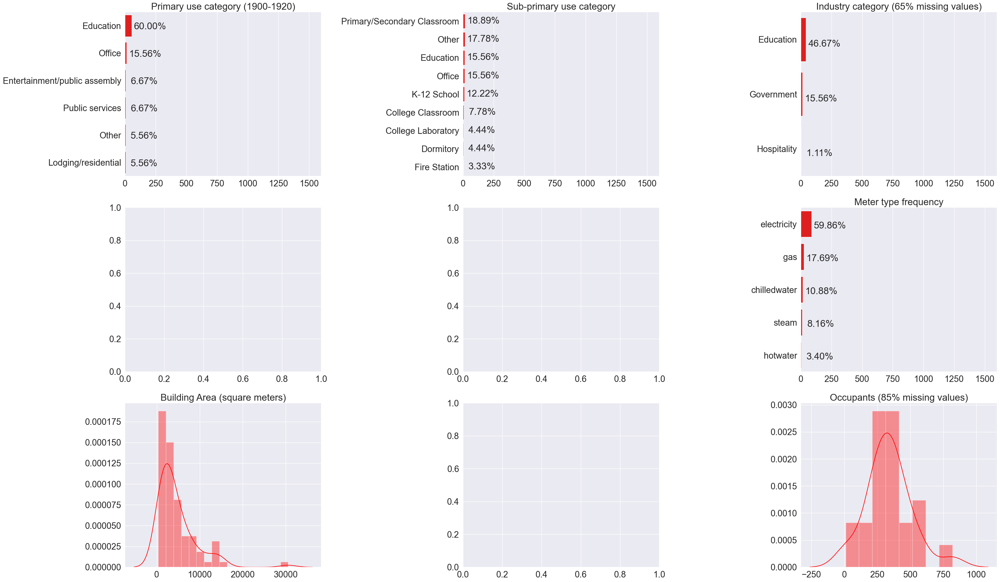

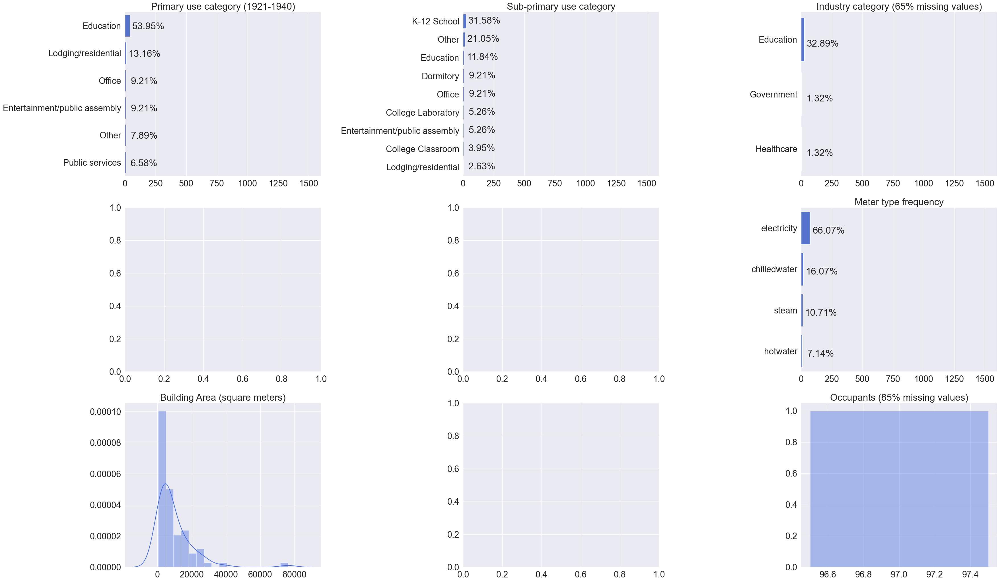

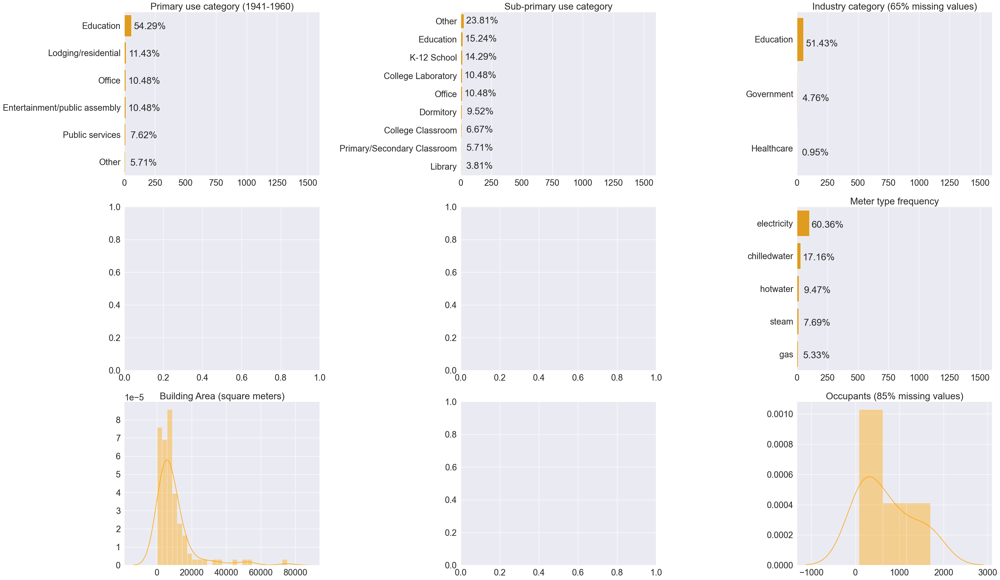

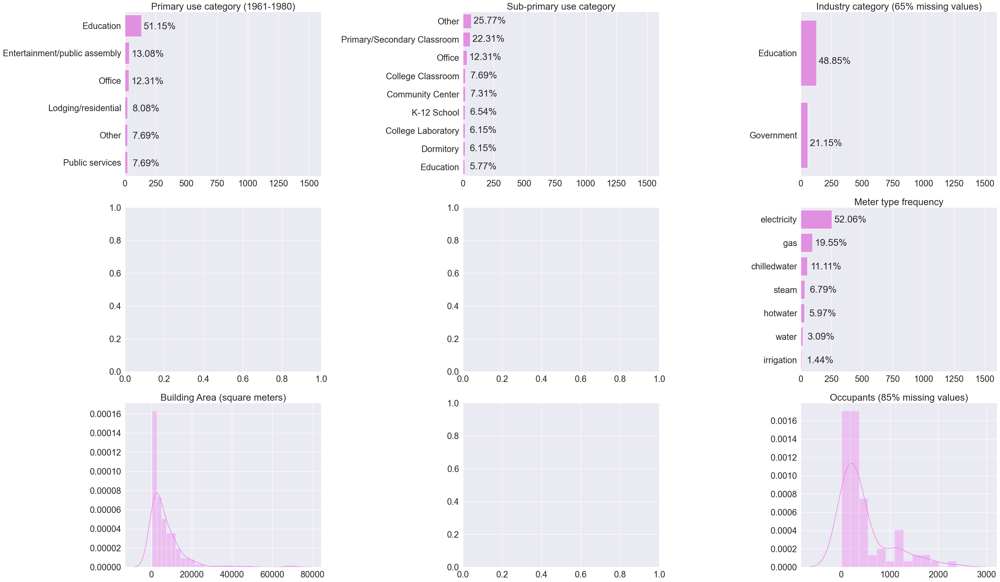

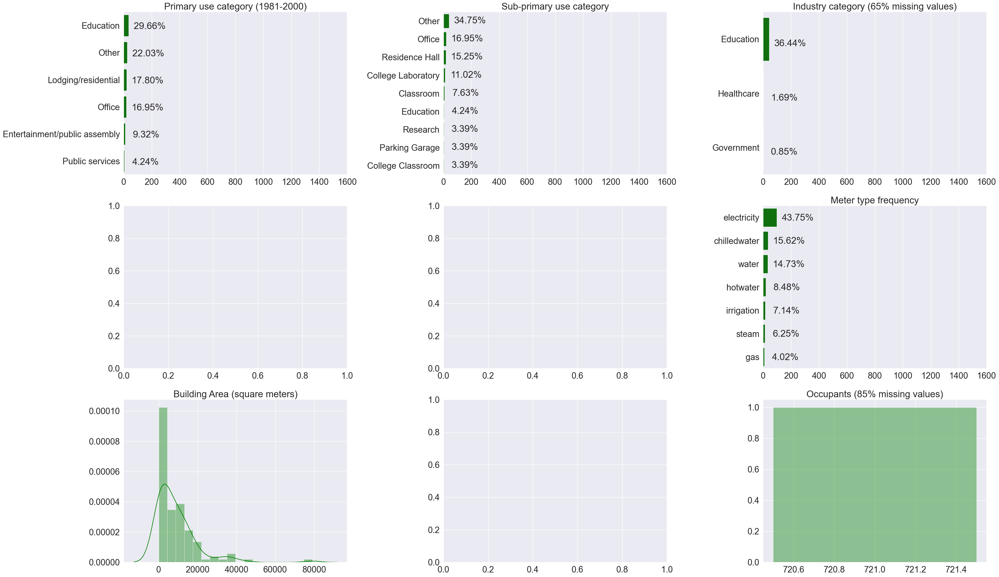

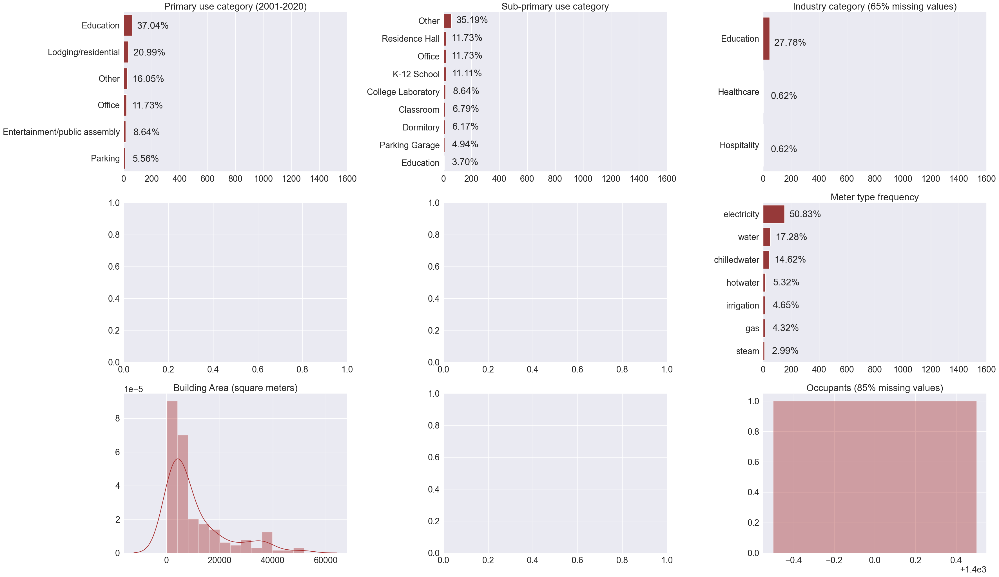

In [7]:
warnings.filterwarnings('ignore')

# Define the year ranges
year_ranges = ["1900-1920", "1921-1940", "1941-1960", "1961-1980", "1981-2000", "2001-2020"]
df_metadata['year_class'] = pd.cut(
    df_metadata['yearbuilt'],
    bins=[1900, 1920, 1940, 1960, 1980, 2000, 2020],
    labels=year_ranges,
    right=True,
)

year_colors = {
    "1900-1920": "red", 
    "1921-1940": "royalblue", 
    "1941-1960": "orange", 
    "1961-1980": "violet", 
    "1981-2000": "green", 
    "2001-2020": "brown"
}

for year_range in year_ranges:
    year_range_metadata = df_metadata[df_metadata['year_class'] == year_range]

    sns.set(rc={'figure.figsize': (36, 21)})
    sns.set(font_scale=2)
    f, axes = plt.subplots(3, 3)
    axes = axes.flatten()
    color = year_colors[year_range]

    # Primary use category countplot in decreasing order
    top5 = list(year_range_metadata['primaryspaceusage'].value_counts().iloc[:5].index)
    temp = year_range_metadata[["primaryspaceusage"]].copy()
    temp.loc[temp.primaryspaceusage.isin(top5) == False, "primaryspaceusage"] = "Other"

    ax1 = axes[0]
    g1 = sns.countplot(data=temp, y="primaryspaceusage", color=color, orient="h", ax=ax1, order=temp['primaryspaceusage'].value_counts().index)
    ax1.title.set_text(f'Primary use category ({year_range})')
    ax1.set(ylabel="", xlabel="", xlim=(0, 1600))

    total = float(len(year_range_metadata))
    for p in g1.patches:
        width = p.get_width()
        g1.text(width + 150,
                p.get_y() + p.get_height() / 1.5,
                '{:1.2%}'.format(width / total),
                ha="center")
    del (top5, temp)

    # Sub-primary use category countplot in decreasing order
    top5 = list(year_range_metadata['sub_primaryspaceusage'].value_counts().iloc[:8].index)
    temp = year_range_metadata[["sub_primaryspaceusage"]].copy()
    temp.loc[temp.sub_primaryspaceusage.isin(top5) == False, "sub_primaryspaceusage"] = "Other"

    ax2 = axes[1]
    g2 = sns.countplot(data=temp, y="sub_primaryspaceusage", color=color, orient="h", ax=ax2, order=temp['sub_primaryspaceusage'].value_counts().index)
    ax2.title.set_text('Sub-primary use category')
    ax2.set(ylabel="", xlabel="", xlim=(0, 1600))

    total = float(len(year_range_metadata))
    for p in g2.patches:
        width = p.get_width()
        g2.text(width + 150,
                p.get_y() + p.get_height() / 1.5,
                '{:1.2%}'.format(width / total),
                ha="center")
    del (top5, temp)

    # Industry countplot in decreasing order
    ax3 = axes[2]
    g3 = sns.countplot(data=year_range_metadata, y="industry", color=color, ax=ax3, orient="h", order=year_range_metadata['industry'].value_counts().index)
    ax3.title.set_text('Industry category (65% missing values)')
    ax3.set(ylabel="", xlabel="", xlim=(0, 1600))

    total = float(len(year_range_metadata))
    for p in g3.patches:
        width = p.get_width()
        g3.text(width + 150,
                p.get_y() + p.get_height() / 1.5,
                '{:1.2%}'.format(width / total),
                ha="center")

    # Meters type frequency
    ax6 = axes[5]
    temp = pd.melt(year_range_metadata[["building_id", "electricity", "hotwater", "chilledwater", "steam", "water", "irrigation", "gas", "solar"]],
                   id_vars="building_id", var_name="meter")
    g6 = sns.countplot(data=temp.loc[temp['value'] == "Yes"], y='meter', color=color, ax=ax6, orient="h",
                       order=temp.loc[temp['value'] == "Yes"]["meter"].value_counts().index)
    g6.title.set_text('Meter type frequency')
    g6.set(ylabel="", xlabel="", xlim=(0, 1600))

    total = temp.loc[temp['value'] == "Yes"]["value"].value_counts()[0]
    for p in g6.patches:
        width = p.get_width()
        g6.text(width + 150,
                p.get_y() + p.get_height() / 1.5,
                '{:1.2%}'.format(width / total),
                ha="center")
    del (temp)

    # "sqft" histogram
    ax7 = axes[6]
    g7 = sns.distplot(year_range_metadata["sqm"], ax=ax7, color=color)
    g7.set(ylabel="", xlabel="")
    ax7.set_title('Building Area (square meters)')

    # "occupants" histogram
    ax9 = axes[8]
    g9 = sns.distplot(year_range_metadata["occupants"].dropna(), ax=ax9, color=color)
    g9.set(ylabel="", xlabel="")
    ax9.set_title('Occupants (85% missing values)')

    plt.tight_layout()
    plt.show()


In [11]:
#merge the column "timezone" from df_metadata onto df_weather on "site_id":
weather_2 = pd.merge(df_weather, df_metadata[["site_id","timezone", "yearbuilt"]], on="site_id", how="left")
weather = pd.merge(df_weather, df_metadata[["site_id","timezone", "yearbuilt"]], on="site_id", how="left")

In [12]:
print(weather_2.columns)

Index(['timestamp', 'site_id', 'airTemperature', 'cloudCoverage',
       'dewTemperature', 'precipDepth1HR', 'precipDepth6HR', 'seaLvlPressure',
       'windDirection', 'windSpeed', 'timezone', 'yearbuilt'],
      dtype='object')


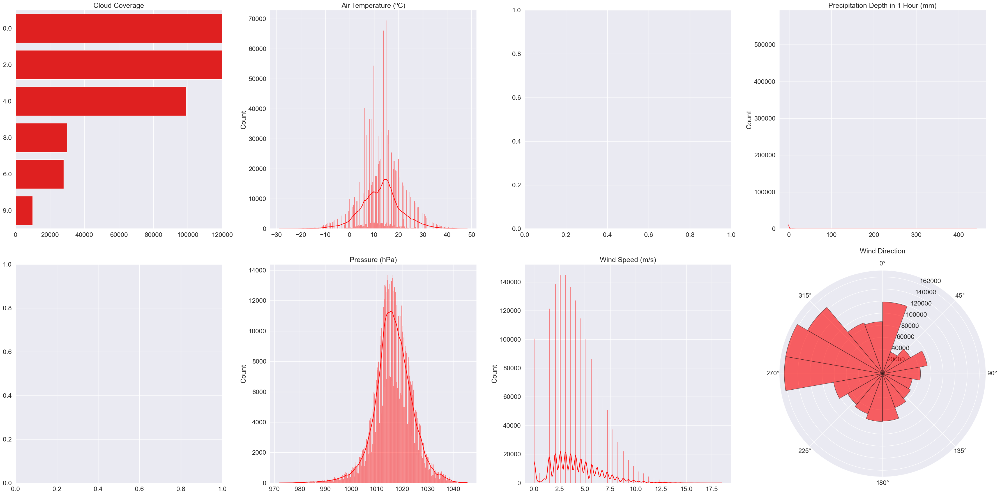

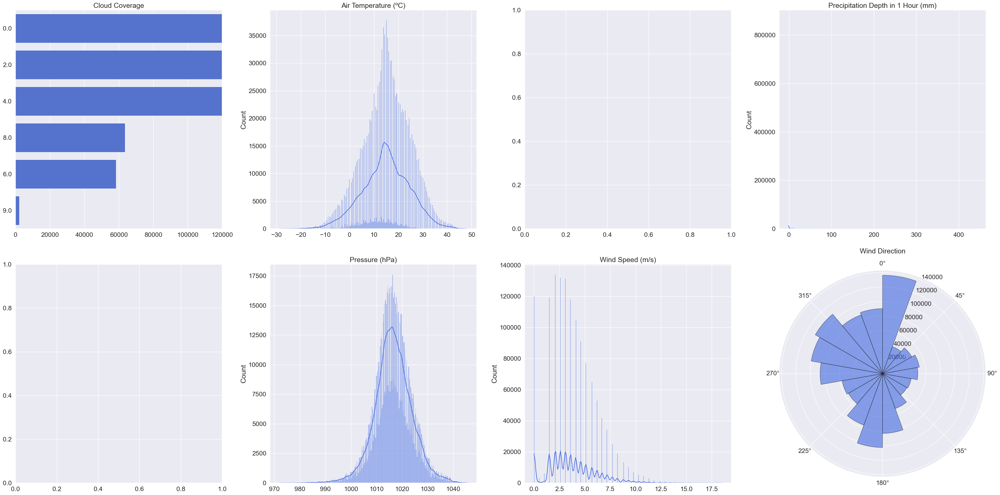

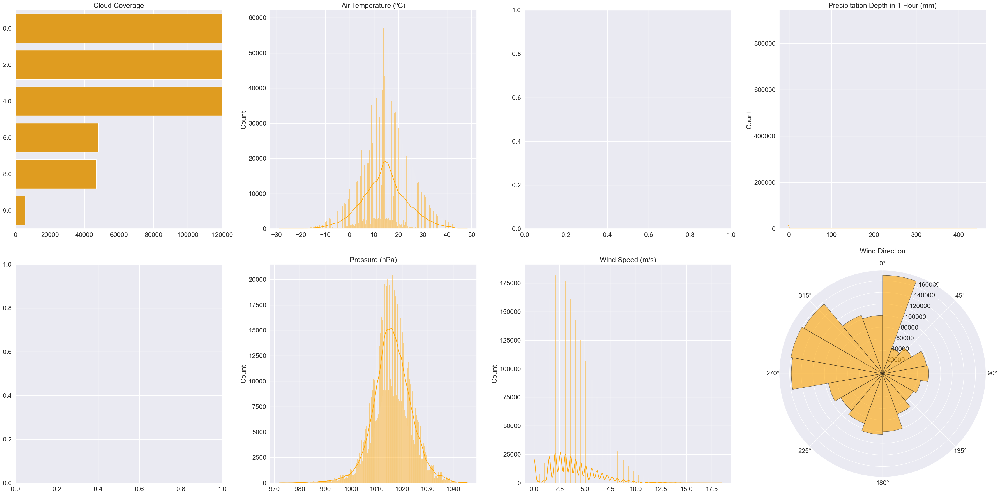

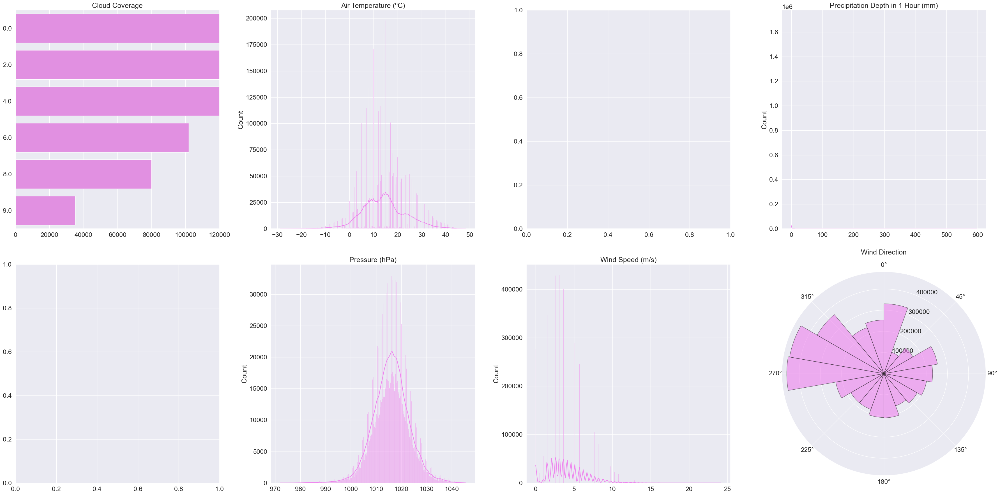

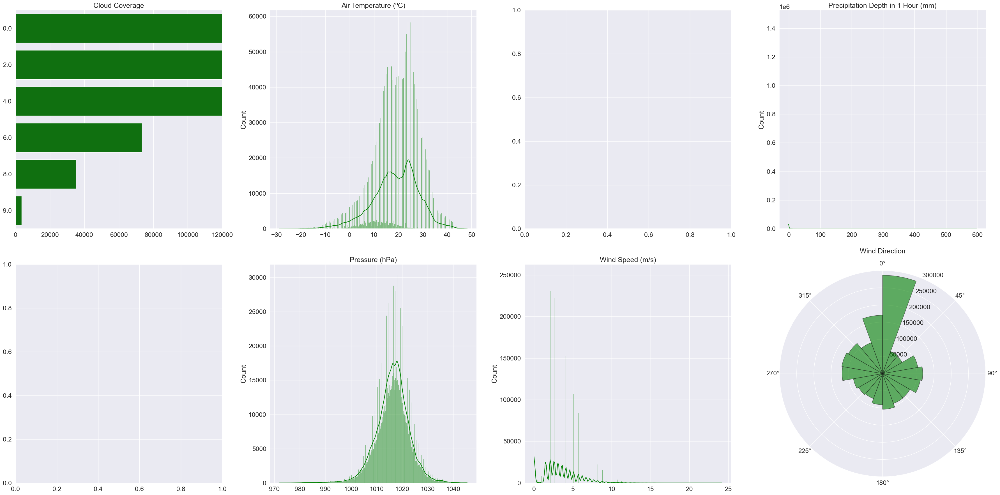

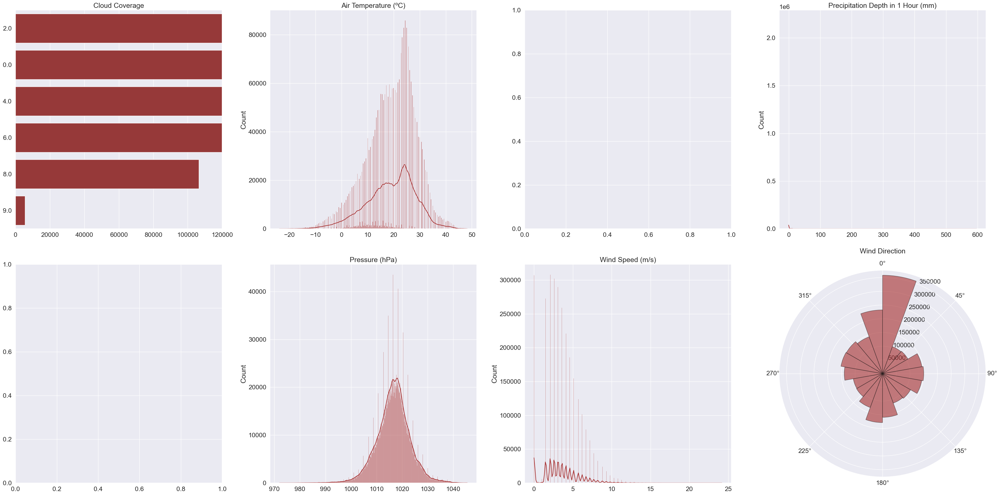

In [13]:
# Suppress warnings
warnings.filterwarnings('ignore')

# Configure Seaborn for aesthetics
sns.set(rc={'figure.figsize': (24, 12)})
sns.set(font_scale=1.5)

# Define a dictionary to map year ranges to colors
year_range_colors = {
    "1900-1920": "red",
    "1921-1940": "royalblue",
    "1941-1960": "orange",
    "1961-1980": "violet",
    "1981-2000": "green",
    "2001-2020": "brown"
}

# Define the year ranges
year_ranges = ["1900-1920", "1921-1940", "1941-1960", "1961-1980", "1981-2000", "2001-2020"]

# Ensure the weather dataset has a `year_class` column
weather_2['year_class'] = pd.cut(
    weather_2['yearbuilt'],  # Ensure this is a column in `weather_2`
    bins=[1900, 1920, 1940, 1960, 1980, 2000, 2020],
    labels=year_ranges,
    right=True,
)

# Iterate over each year range to create plots
for year_range in year_ranges:
    # Filter data for the current year range
    weather = weather_2[weather_2["year_class"] == year_range]
    color = year_range_colors[year_range]

    # Create the figure and subplots
    fig, axes = plt.subplots(2, 4, figsize=(36, 18))
    axes = axes.flatten()

    # Cloud Coverage countplot
    sns.countplot(
        data=weather,
        y="cloudCoverage",
        color=color,
        orient="h",
        ax=axes[0],
        order=weather['cloudCoverage'].value_counts().index
    )
    axes[0].set_title('Cloud Coverage')
    axes[0].set(ylabel="", xlabel="", xlim=(0, 120000))

    # Air Temperature histogram
    sns.histplot(
        weather["airTemperature"].dropna(),
        ax=axes[1],
        color=color,
        kde=True
    )
    axes[1].set_title('Air Temperature (ºC)')
    axes[1].set(xlabel="")

    # Precipitation Depth histogram
    sns.histplot(
        weather["precipDepth1HR"].dropna(),
        ax=axes[3],
        color=color,
        kde=True,
        binwidth=0.1
    )
    axes[3].set_title('Precipitation Depth in 1 Hour (mm)')
    axes[3].set(xlabel="")

    # Sea Level Pressure histogram
    sns.histplot(
        weather["seaLvlPressure"].dropna(),
        ax=axes[5],
        color=color,
        kde=True
    )
    axes[5].set_title('Pressure (hPa)')
    axes[5].set(xlabel="")

    # Wind Speed histogram
    sns.histplot(
        weather["windSpeed"].dropna(),
        ax=axes[6],
        color=color,
        kde=True
    )
    axes[6].set_title('Wind Speed (m/s)')
    axes[6].set(xlabel="")

    # Wind Direction polar histogram
    degrees = weather["windDirection"].dropna()
    radians = np.deg2rad(degrees)
    bin_size = 20
    counts, bins = np.histogram(degrees, bins=np.arange(0, 360 + bin_size, bin_size))
    centers = np.deg2rad((bins[:-1] + bins[1:]) / 2)

    polar_ax = fig.add_subplot(2, 4, 8, projection='polar')
    polar_ax.set_theta_zero_location("N")
    polar_ax.set_theta_direction("clockwise")
    polar_ax.bar(centers, counts, width=np.deg2rad(bin_size), bottom=0.0, color=color, alpha=0.6, edgecolor='k')
    polar_ax.set_title('Wind Direction', pad=20)

    # Remove unused axes
    fig.delaxes(axes[7])  # Unused 7th subplot

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


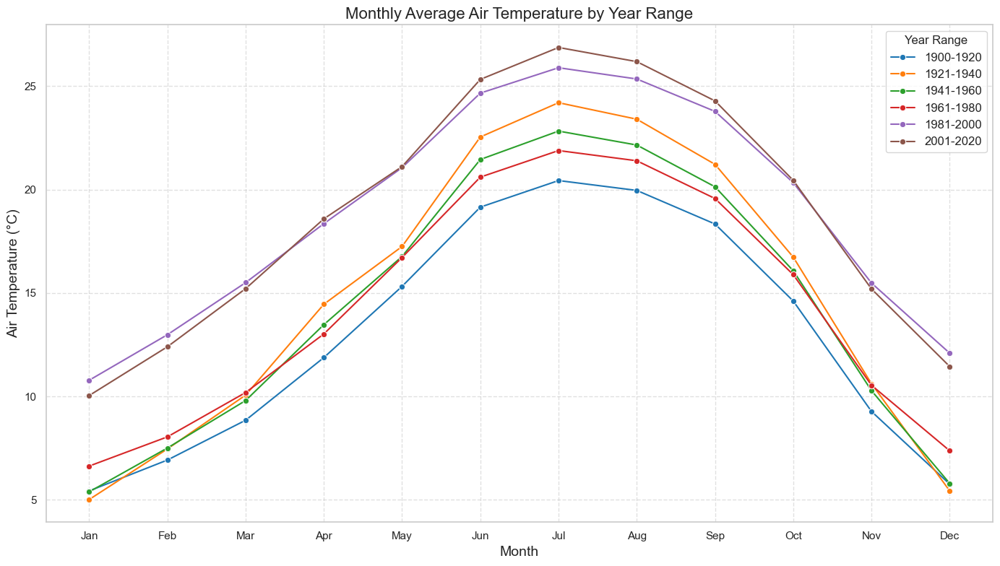

In [14]:
# Convert the 'timestamp' column to datetime
weather_2["timestamp"] = pd.to_datetime(weather_2["timestamp"])

# Extract the month from the timestamp
weather_2["month"] = weather_2["timestamp"].dt.month

# Create a year_class column based on the yearbuilt
weather_2["year_class"] = pd.cut(
    weather_2["yearbuilt"],
    bins=[1900, 1920, 1940, 1960, 1980, 2000, 2020],
    labels=["1900-1920", "1921-1940", "1941-1960", "1961-1980", "1981-2000", "2001-2020"],
    right=True
)

# Group data by year_class and month, calculating average air temperature
monthly_avg_temp = weather_2.groupby(["year_class", "month"])["airTemperature"].mean().reset_index()

# Set up the plot aesthetics
sns.set(style="whitegrid", rc={'figure.figsize': (14, 8)})
sns.set_palette("tab10")

# Create a line plot of monthly air temperature by year range
plt.figure(figsize=(14, 8))
sns.lineplot(
    data=monthly_avg_temp,
    x="month",
    y="airTemperature",
    hue="year_class",
    marker="o"
)

# Customize the plot
plt.title("Monthly Average Air Temperature by Year Range", fontsize=16)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Air Temperature (°C)", fontsize=14)
plt.xticks(ticks=range(1, 13), labels=[
    "Jan", "Feb", "Mar", "Apr", "May", "Jun",
    "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"
])
plt.legend(title="Year Range", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)

# Show the plot
plt.tight_layout()
plt.show()


In [15]:
# Reformat the meters dataframes first

def melt_meter_dataframes (df, meter_name):
  #timestamp into datetime
  df['timestamp'] = pd.to_datetime(df['timestamp'])
  # Melt the DataFrame: columns become rows under 'building_id', and their values go under 'meter_reading'
  df = df.melt(
      id_vars=["timestamp"],              # Columns to keep as is
      var_name="building_id",             # Name for the new column with former column names
      value_name="meter_reading"          # Name for the new column with values from the original DataFrame
      )

  # Add the 'meter' column
  df["meter"] = meter_name

  # Rearrange columns for clarity
  df = df[["timestamp", "building_id", "meter", "meter_reading"]]

  return df

df_electricity = melt_meter_dataframes(df_electricity, "electricity")
df_gas = melt_meter_dataframes(df_gas, "gas")
df_hotwater = melt_meter_dataframes(df_hotwater, "hotwater")
df_chilledwater = melt_meter_dataframes(df_chilledwater, "chilledwater")
df_steam = melt_meter_dataframes(df_steam, "steam")
df_water = melt_meter_dataframes(df_water, "water")
df_irrigation = melt_meter_dataframes(df_irrigation, "irrigation")
df_solar = melt_meter_dataframes(df_solar, "solar")

In [16]:
# Function to reduce the DF size ( https://www.kaggle.com/caesarlupum/ashrae-start-here-a-gentle-introduction)
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

# Reduce memory
df_metadata = reduce_mem_usage(df_metadata)
gc.collect()

Mem. usage decreased to  0.32 Mb (19.4% reduction)


417581

In [17]:
# Concatenate all meters data and then merge it with metadata

# Concatenate all the meter dataframes
meters = pd.concat([df_electricity, df_gas, df_hotwater, df_chilledwater, df_steam, df_water, df_irrigation, df_solar])
meters = reduce_mem_usage(meters)
gc.collect()

# Features from buildings metadata to add to meters dataset
buildings_sel = df_metadata[["building_id","site_id","primaryspaceusage","timezone", "yearbuilt"]]

# Join the datasets: meter reading + building metadata
dev = meters.merge(buildings_sel, on="building_id", how = "left")

# Transform timestamp to datetime object type
dev["timestamp"] = pd.to_datetime(dev["timestamp"], format='%Y-%m-%d %H:%M:%S')

del(meters, buildings_sel, df_metadata)

Mem. usage decreased to 1838.90 Mb (10.0% reduction)


In [18]:
dev.columns

Index(['timestamp', 'building_id', 'meter', 'meter_reading', 'site_id',
       'primaryspaceusage', 'timezone', 'yearbuilt'],
      dtype='object')

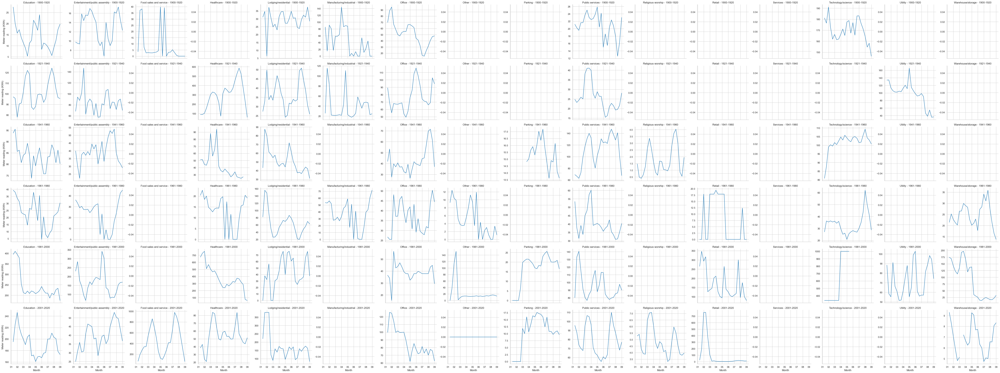

In [20]:
# Suppress warnings
warnings.filterwarnings('ignore')

# Ensure the timestamp column is in datetime format
dev["timestamp"] = pd.to_datetime(dev["timestamp"])

# Convert the 'yearbuilt' column to a supported numeric type (e.g., float64 or int)
dev["yearbuilt"] = dev["yearbuilt"].astype("float64")  # or .astype("int") if no NaN values exist

# Create a year_class column based on yearbuilt
dev["year_class"] = pd.cut(
    dev["yearbuilt"],
    bins=[1900, 1920, 1940, 1960, 1980, 2000, 2020],
    labels=["1900-1920", "1921-1940", "1941-1960", "1961-1980", "1981-2000", "2001-2020"],
    right=True
)

# Grouping the data by primary space usage, year_class, and month
temp = dev.groupby(["primaryspaceusage", "year_class", pd.Grouper(key="timestamp", freq="M")])["meter_reading"].median().reset_index()

# Create FacetGrid to plot meter readings by primary space usage and year range
g = sns.FacetGrid(temp, col="primaryspaceusage", row="year_class", sharey=False, height=4)

g.map(plt.plot, "timestamp", "meter_reading")

# Set titles and labels
g.set_titles("{col_name} - {row_name}")
g.set_axis_labels("Month", "Meter reading (KWh)")

# Customizing x-axis ticks to show months
for ax in g.axes.flat:
    ax.xaxis.set_major_formatter(plt.FixedFormatter(temp["timestamp"].dt.strftime("%m")))  # Month format

# Show the plot
plt.tight_layout()
plt.show()


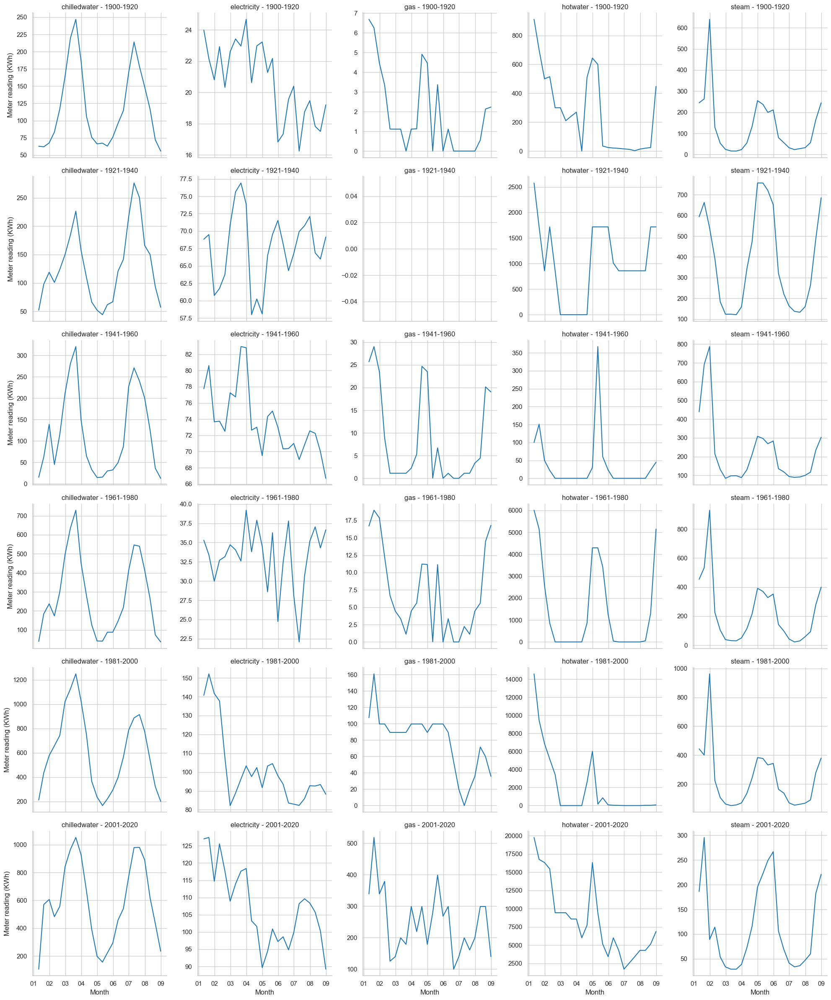

In [21]:
# Filter the dataframe to include specific meter types
dev_meters = dev[dev['meter'].isin(["electricity", "chilledwater", "steam", "hotwater", "gas"])]

# Ensure the timestamp column is in datetime format
dev_meters["timestamp"] = pd.to_datetime(dev_meters["timestamp"])

# Convert 'yearbuilt' to a supported numeric type if necessary
dev_meters["yearbuilt"] = dev_meters["yearbuilt"].astype("float64")  # or .astype("int") if appropriate

# Create a year_class column based on yearbuilt
dev_meters["year_class"] = pd.cut(
    dev_meters["yearbuilt"],
    bins=[1900, 1920, 1940, 1960, 1980, 2000, 2020],
    labels=["1900-1920", "1921-1940", "1941-1960", "1961-1980", "1981-2000", "2001-2020"],
    right=True
)

# Grouping the data by meter type, year_class, and month
temp = dev_meters.groupby(["meter", "year_class", pd.Grouper(key="timestamp", freq="M")])["meter_reading"].median().reset_index()

# Create FacetGrid to plot meter readings by meter type and year range
g = sns.FacetGrid(temp, col="meter", row="year_class", sharey=False, height=4)

g.map(plt.plot, "timestamp", "meter_reading")

# Set titles and labels
g.set_titles("{col_name} - {row_name}")
g.set_axis_labels("Month", "Meter reading (KWh)")

# Customizing x-axis ticks
for ax in g.axes.flat:
    ax.xaxis.set_major_formatter(plt.FixedFormatter(temp["timestamp"].dt.strftime("%m")))  # Month format

# Show the plot
plt.tight_layout()
plt.show()

# Delete temporary dataframes
del(temp, dev_meters)


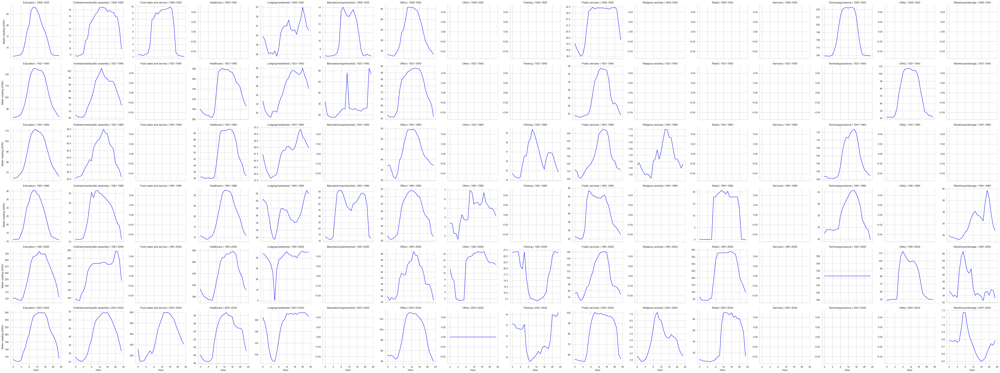

In [22]:
# Ensure the timestamp column is in datetime format
dev["timestamp"] = pd.to_datetime(dev["timestamp"])

# Convert 'yearbuilt' to a supported numeric type if necessary
dev["yearbuilt"] = dev["yearbuilt"].astype("float64")  # or .astype("int") if appropriate

# Create a year_class column based on yearbuilt
dev["year_class"] = pd.cut(
    dev["yearbuilt"],
    bins=[1900, 1920, 1940, 1960, 1980, 2000, 2020],
    labels=["1900-1920", "1921-1940", "1941-1960", "1961-1980", "1981-2000", "2001-2020"],
    right=True
)

# Extract the hour from the timestamp column
dev["hour"] = dev["timestamp"].dt.hour

# Group the data by year_class, primaryspaceusage, and hour
temp = dev.groupby(["year_class", "primaryspaceusage", "hour"])["meter_reading"].median().reset_index()

# Define a color for the plots
line_color = "blue"

# Create a FacetGrid for visualizing the data with rows for year_class and columns for primaryspaceusage
g = sns.FacetGrid(temp, col="primaryspaceusage", row="year_class", height=4, sharey=False)

# Map the line plot to the grid
g.map(plt.plot, "hour", "meter_reading", color=line_color)

# Title of each plot
g.set_titles("{col_name} | {row_name}")

# Axis labels
g.set_axis_labels("Hour", "Meter reading (KWh)")

# Set x-axis ticks for hours
g.set(xticks=[0, 4, 8, 12, 16, 20, 24])

# Adjust layout
plt.tight_layout()
plt.show()


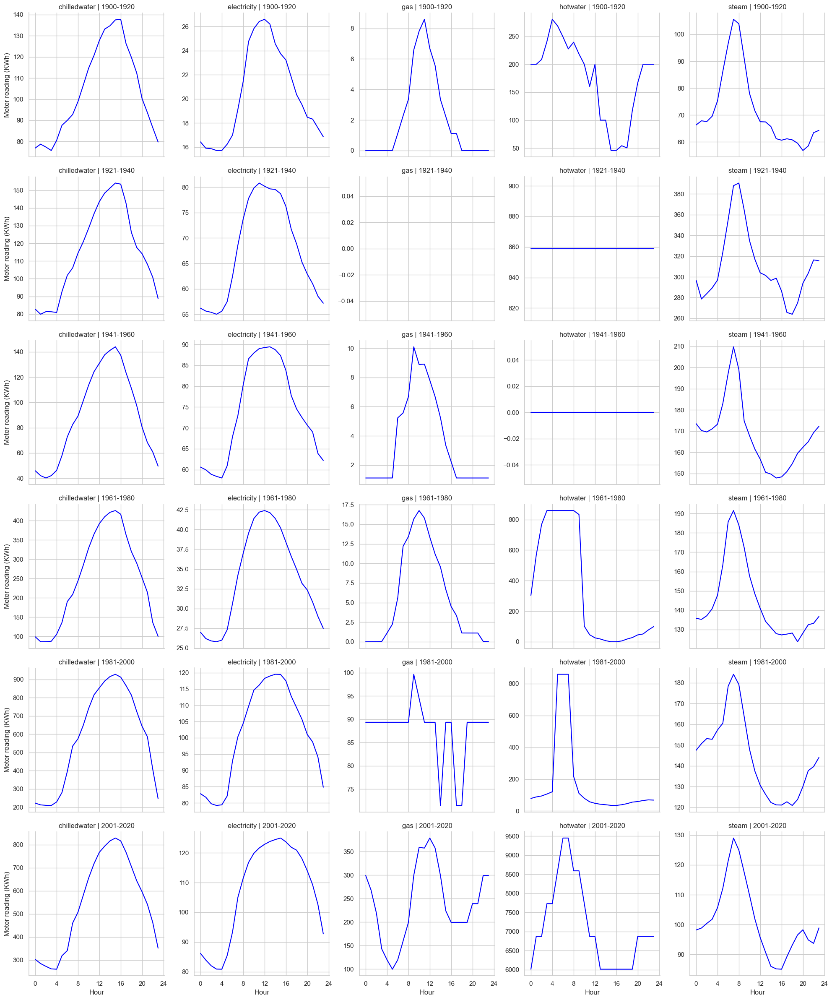

In [23]:
# Separate dataframe for visualization, selecting specific meter types
dev_meters = dev[dev['meter'].isin(["electricity", "chilledwater", "steam", "hotwater", "gas"])]

# Ensure the timestamp column is in datetime format
dev_meters["timestamp"] = pd.to_datetime(dev_meters["timestamp"])

# Convert 'yearbuilt' to a supported numeric type if necessary
dev_meters["yearbuilt"] = dev_meters["yearbuilt"].astype("float64")  # or .astype("int") if appropriate

# Create a year_class column based on yearbuilt
dev_meters["year_class"] = pd.cut(
    dev_meters["yearbuilt"],
    bins=[1900, 1920, 1940, 1960, 1980, 2000, 2020],
    labels=["1900-1920", "1921-1940", "1941-1960", "1961-1980", "1981-2000", "2001-2020"],
    right=True
)

# Extract the hour from the timestamp column
dev_meters["hour"] = dev_meters["timestamp"].dt.hour

# Group the data by year_class, meter, and hour
temp = dev_meters.groupby(["year_class", "meter", "hour"])["meter_reading"].median().reset_index()

# Define a color for the plots
line_color = "blue"

# Create a FacetGrid for visualizing the data with rows for year_class and columns for meter type
g = sns.FacetGrid(temp, col="meter", row="year_class", height=4, sharey=False)

# Map the line plot to the grid
g.map(plt.plot, "hour", "meter_reading", color=line_color)

# Title of each plot
g.set_titles("{col_name} | {row_name}")

# Axis labels
g.set_axis_labels("Hour", "Meter reading (KWh)")

# Set x-axis ticks for hours
g.set(xticks=[0, 4, 8, 12, 16, 20, 24])

# Adjust layout
plt.tight_layout()
plt.show()

# Delete unnecessary datasets
del(temp, dev_meters)
